# External Validation

## 1. Setting

In [1]:
from typing import Any
import numpy as np
import pandas as pd
import os, matplotlib, random, math, shutil, time
from matplotlib import pyplot as plt
import skimage, h5py, logging, argparse
from tqdm import tqdm
from skimage import io as skio
from skimage import transform as skit
from skimage import filters as skif

import tensorflow as tf
from tensorflow import keras as tfk

2023-12-16 21:28:47.896543: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-16 21:28:48.801398: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-12-16 21:28:48.801499: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-12-16 21:28:48.801508: W tensorfl

In [2]:
def config_dic(model_name):
    return {'seed': 999, 
            'model_name': model_name, # 신경망 모델 이름: vgg16, vgg19, resnet50
            'input_size': (256, 256, 3), # 입력 영상 크기: (32,32,3), (64, 64, 3), (128, 128, 3), (256, 256, 3)
            'class_num': 2, # 분류할 클래스 수
            'train_num': None, # 클래스 당 Train number
            'val_num': 10, # 클래스 당 validation number
            'batch_size': 32, # Batch Size: 4, 8, 16
            'epoch': 200,
            'drop_rate': 0.5,
            'dens_filters': [1000, 500, 100],
            'optimizer': 'adam', # adam, adamw, rmsprop
            'learning_rate': 1e-3, 
            }

In [3]:
from etc.cls_keras import CLS_Keras
from etc.cls_keras import TensorSequence 
clsk = CLS_Keras(config_dic('vgg16'))


## 2. Preprocessing

In [4]:
data_path = '/home/student/Datasets/jhjeong/VUNO/raw_data/external_fruits/'
label_list = sorted(os.listdir(data_path))
print(label_list)

['grapes', 'lemon', 'orange', 'pineapple', 'watermelon']


In [5]:
test_paths = []
for i in sorted(os.listdir(data_path)):
    fol_path = os.path.join(data_path, i)
    for j in sorted(os.listdir(fol_path)):
        file_path = os.path.join(fol_path, j)
        test_paths.append(file_path)
print(f' - 테스트 데이터셋(Test) 숫자 = {len(test_paths)}')

 - 테스트 데이터셋(Test) 숫자 = 20


In [10]:
clsk._prep_csv_making('ext', '/home/student/Datasets/jhjeong/VUNO/prep_data/fruit5/',
                      test_paths, (256, 256, 3))

img_020_watermelon_ext: KakaoTalk_20231215_000530316.jpg, watermelon: 100%|██████████| 20/20 [00:09<00:00,  2.02it/s]   


In [13]:
def prep_csv_making(set_type, output_path, data_paths, prep_size):
    data_dic = {'name': [], 'class': [], 'org_name': [], 'org_shape': [], 'prep_shape': []}
    error_dic = {'file': [], 'message': []}
    data_out_path = os.path.join(output_path, set_type)
    os.makedirs(data_out_path, exist_ok=True)
    pbar = tqdm(total=len(data_paths))
    for i, i_ in enumerate(data_paths):
        try:
            # Image Loading
            org_array = skio.imread(i_)
            new_array = skit.resize(org_array, prep_size)
            data_label = 'fruits' #i_.split('/')[-2]
            data_name = f'img_{str(1001+i)[1:]}_{data_label}_{set_type}' 
            out_file_path = os.path.join(data_out_path, f'{data_name}.png')
            # Image Saving
            skio.imsave(out_file_path, clsk._norm_array(new_array))
            # info save
            data_dic['name'].append(data_name)
            data_dic['class'].append(data_label)
            data_dic['org_name'].append(os.path.basename(i_))
            data_dic['org_shape'].append(org_array.shape)
            data_dic['prep_shape'].append(new_array.shape)
        except Exception as err:
            error_dic['file'].append(i_)
            error_dic['message'].append(err)
        pbar.set_description(f'{data_name}: {os.path.basename(i_)}, {data_label}')
        pbar.update(1)
    pbar.close()
    df_data = pd.DataFrame(data_dic)
    df_data.to_csv(os.path.join(output_path, f'{set_type}_info_dic.csv'), index=False)
    df_error = pd.DataFrame(error_dic)
    df_error.to_csv(os.path.join(output_path, f'{set_type}_error_dic.csv'), index=False)

prep_csv_making('ext', '/home/student/Datasets/jhjeong/VUNO/prep_data/fruit_veg/', 
                test_paths, (256, 256, 3))

img_020_fruits_ext: KakaoTalk_20231215_000530316.jpg, fruits: 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]   


## 3. Inference

In [6]:
def test_cls(input_path, output_path, model_name, label_list):
    output_path = output_path + f'_{model_name}'
    # Log Setting
    log_name = 'TestExt_{}_{}'.format(os.path.basename(output_path), time.strftime('%Y%m%d_%H%M', time.localtime(time.time())))
    log_path = os.path.join(output_path, 'log')
    os.makedirs(log_path, exist_ok=True)
    logger = clsk._logger_setting(log_path, log_name)
    logger.info('### Test External CLS ###')

    # Tensor loading
    test_paths = []
    for i_ in sorted(os.listdir(os.path.join(input_path, 'ext'))):
        file_path = os.path.join(input_path, 'ext', i_)
        test_paths.append(file_path)
    logger.info(f' - Train Number = {len(test_paths)}')

    # GPU Setting
    tf.random.set_seed(999)
    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        # Model Build
        model = clsk._model_build(model_name, 
                                  (256, 256, 3),
                                  (1000, 500, 100),
                                  0.5,
                                  len(label_list))
        model.summary(print_fn=logger.info)

    # csv loading
    df_test = pd.read_csv(os.path.join(input_path, 'ext_info_dic.csv'))
    result_dic = {'name': list(df_test['name']),
                  'org_name': list(df_test['org_name']),
                  'label': list(df_test['class']),
                  'prediction': []}
    for k in label_list:
        result_dic[f'prob_{k}'] = []
    logger.info(f' - info Keys: {result_dic.keys()}')
    
    # Prediction
    doc_path = os.path.join(output_path, 'doc')
    result_path = os.path.join(output_path, 'result_ext')
    os.makedirs(result_path, exist_ok=True)
    model.load_weights(os.path.join(output_path, 'model.h5'))
    proc_num = 0
    for b in tqdm(range(len(test_paths)//10)):
        if b < len(test_paths)//10 -1:
            test_batchs = test_paths[b*10:(b+1)*10]
        else:
            test_batchs = test_paths[b*10:]
        pred_results = model.predict(TensorSequence(test_batchs, 
                                                    10, 
                                                    label_list, 
                                                    train=False,
                                                    shuffle=False),
                                        verbose=0)
        # Result Save
        for i in range(pred_results.shape[0]):
            pred = label_list[list(pred_results[i]).index(np.max(pred_results[i]))]
            label = result_dic['label'][proc_num+i]
            # figure save
            correct = 'True' if pred == label else 'False'
            img = skio.imread(test_batchs[i])
            img = np.expand_dims(img, axis=0)
            # gradcam
            heatmap1 = clsk._make_gradcam_heatmap(img, model, 'conv4_block6_out',['post_relu','avg_pool'])
            heatmap2 = clsk._make_gradcam_heatmap(img, model, 'conv5_block3_out',['post_relu','avg_pool'])
            hm1 = skit.resize(heatmap1, (256, 256), anti_aliasing=True)
            hm1 = skif.gaussian(hm1, sigma=3)
            hm2 = skit.resize(heatmap2, (256, 256), anti_aliasing=True)
            hm2 = skif.gaussian(hm2, sigma=3)
            hmn = (hm1+hm2)/2
            heatmap_n = np.uint8(255 * hmn)
            plt.figure(figsize=(8,8))
            plt.imshow(img[0])
            plt.imshow(heatmap_n, alpha=0.5)
            plt.title(f'{correct}: ({label}:{pred})', fontsize=10)
            plt.savefig(os.path.join(result_path, f'{result_dic["name"][proc_num+i]}_{correct}.png'))
            # Dict
            result_dic['prediction'].append(pred)
            for j, j_ in enumerate(label_list):
                result_dic[f'prob_{j_}'].append(pred_results[i][j])
        # Log
        proc_num += len(test_batchs)
        logger.info(f' => ({proc_num}/{len(test_paths)}). Inference prediction shape = {pred_results.shape}')
        
    # CSV Saving
    df_result = pd.DataFrame(result_dic)
    df_result.to_csv(os.path.join(doc_path, f'{log_name}_test_ext.csv'))

2023-12-16 21:21:47,037 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO - ### Test External CLS ###
2023-12-16 21:21:47,039 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO -  - Train Number = 20


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


2023-12-16 21:21:51,318 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO - Model: "model_122"
2023-12-16 21:21:51,319 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO - __________________________________________________________________________________________________
2023-12-16 21:21:51,320 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO -  Layer (type)                   Output Shape         Param #     Connected to                     
2023-12-16 21:21:51,321 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO - ==================================================================================================
2023-12-16 21:21:51,322 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO -  input_63 (InputLayer)          [(None, 256, 256, 3  0           []                               
2023-12-16 21:21:51,323 - TestExt_fruit_veg_resnet152_20231216_2121 - INFO -                                 )]                                                                
2023-12-16 21:21:51,323 

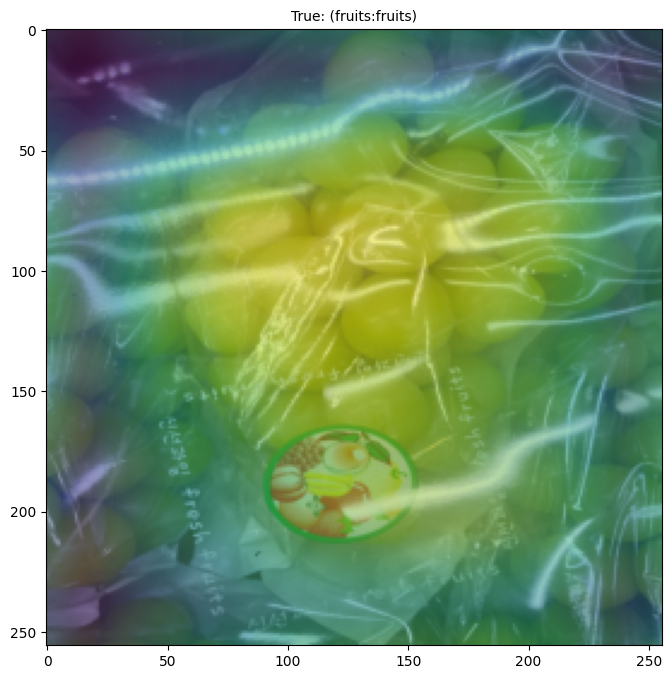

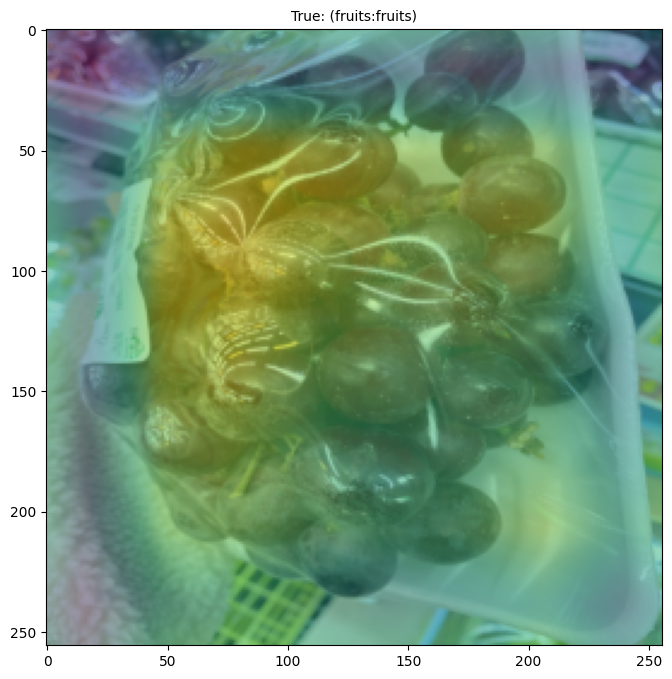

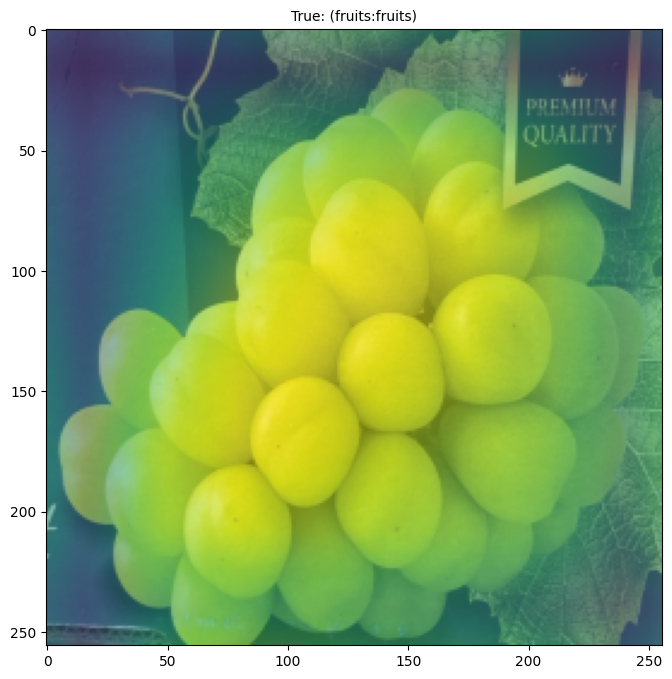

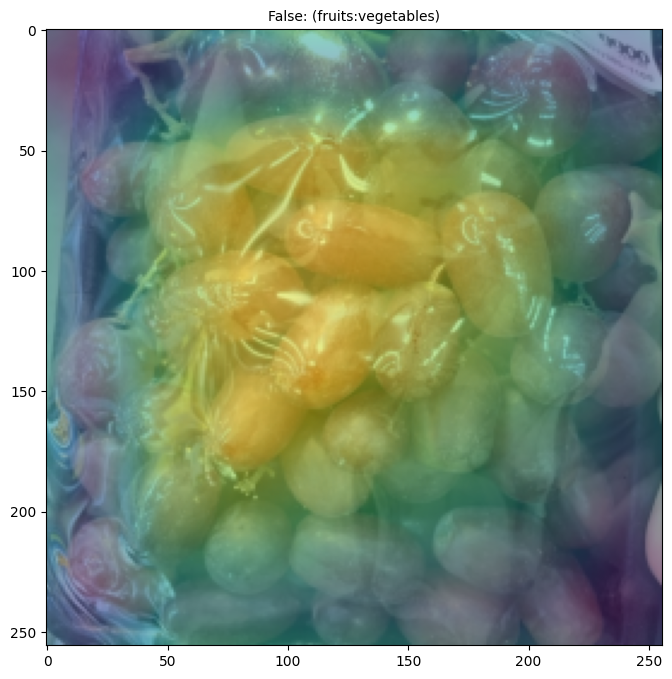

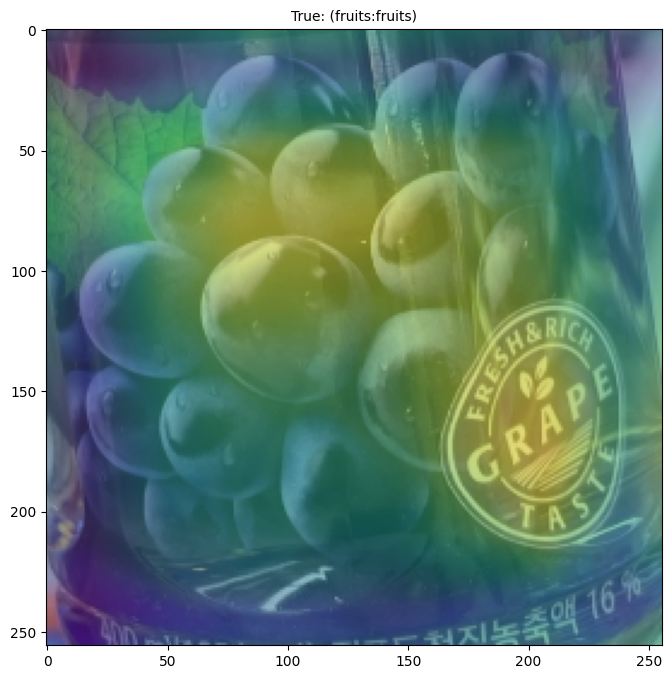

...

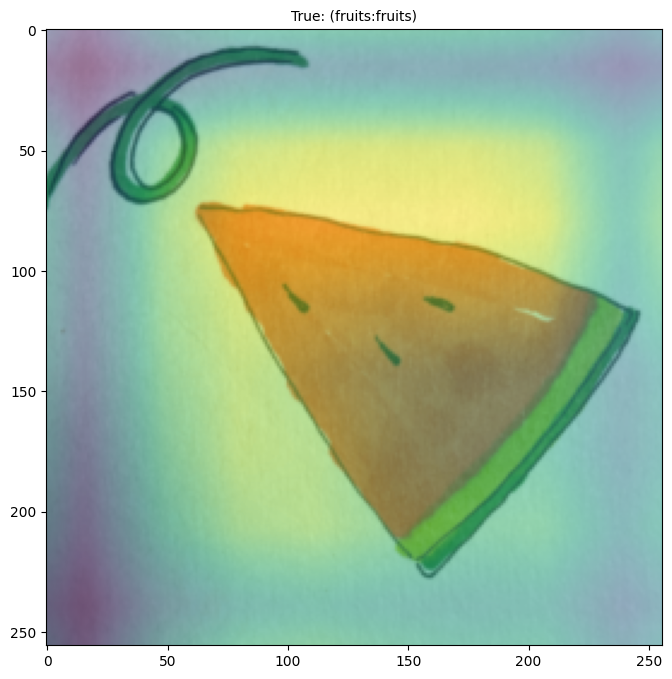

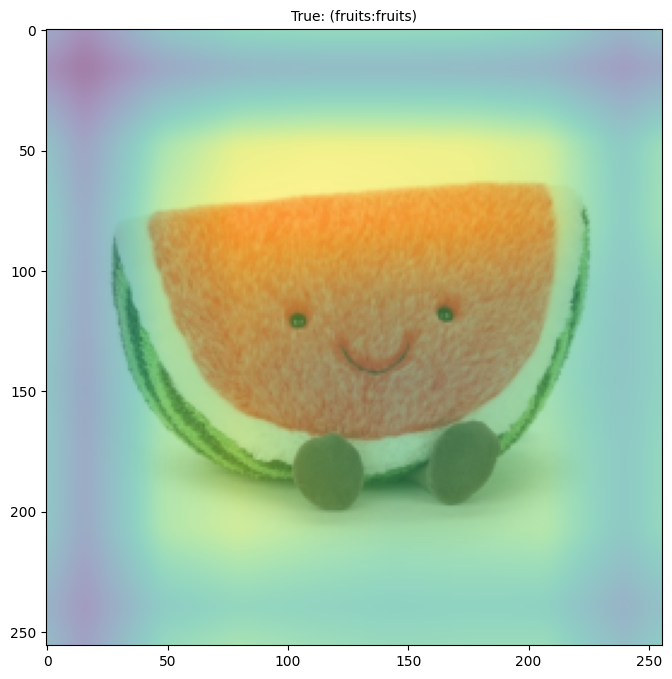

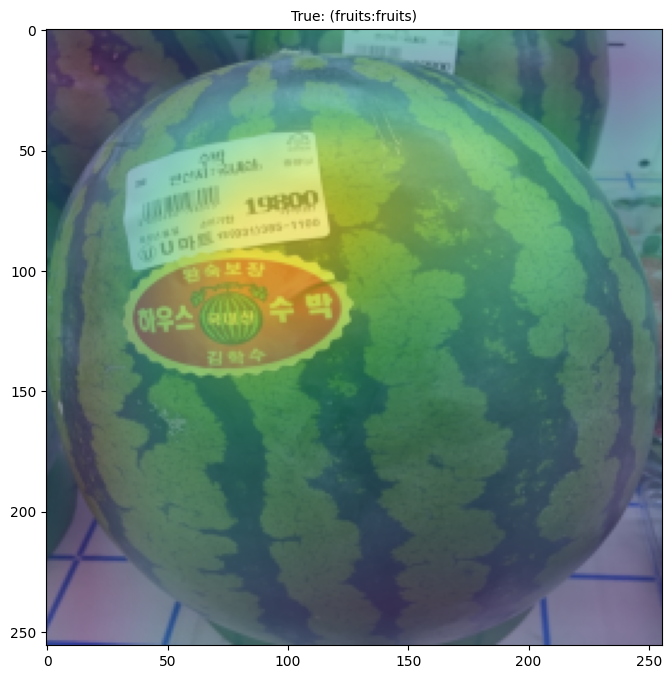

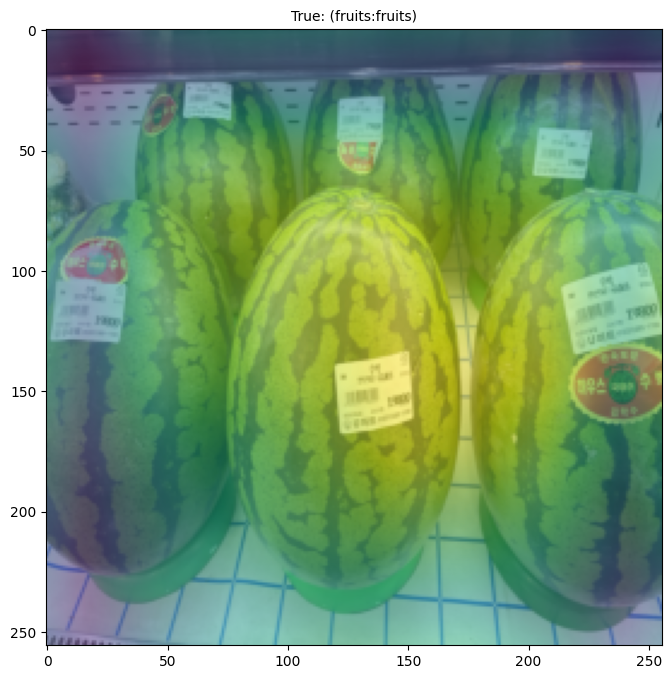

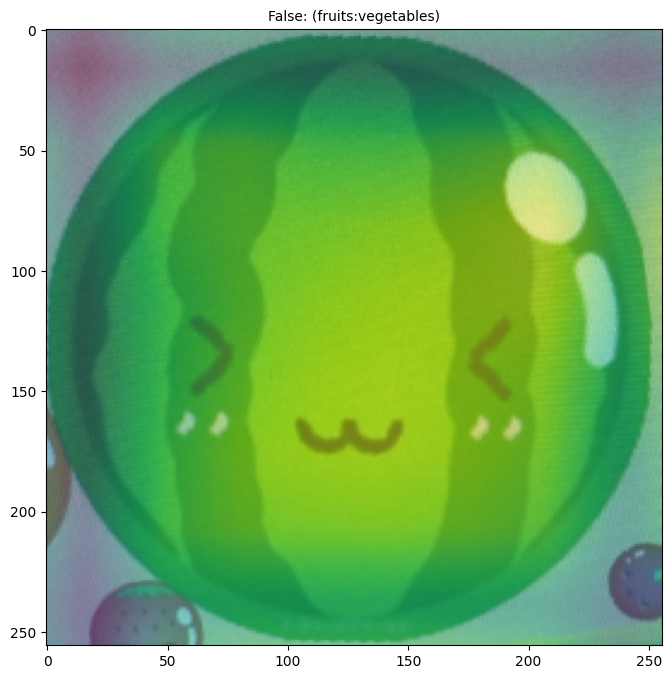

In [20]:
test_cls('/home/student/Datasets/jhjeong/VUNO/prep_data/fruit_veg/', 
         '/home/student/Datasets/jhjeong/VUNO/post_data/fruit_veg',
         'resnet152', ['fruits', 'vegetables'])

2023-12-16 21:30:51,983 - TestExt_fruit5_resnet50_20231216_2130 - INFO - ### Test External CLS ###
2023-12-16 21:30:51,985 - TestExt_fruit5_resnet50_20231216_2130 - INFO -  - Train Number = 20


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task

2023-12-16 21:30:57,686 - TestExt_fruit5_resnet50_20231216_2130 - INFO - Model: "model"
2023-12-16 21:30:57,687 - TestExt_fruit5_resnet50_20231216_2130 - INFO - __________________________________________________________________________________________________
2023-12-16 21:30:57,688 - TestExt_fruit5_resnet50_20231216_2130 - INFO -  Layer (type)                   Output Shape         Param #     Connected to                     
2023-12-16 21:30:57,689 - TestExt_fruit5_resnet50_20231216_2130 - INFO - ==================================================================================================
2023-12-16 21:30:57,689 - TestExt_fruit5_resnet50_20231216_2130 - INFO -  input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
2023-12-16 21:30:57,690 - TestExt_fruit5_resnet50_20231216_2130 - INFO -                                 )]                                                                
2023-12-16 21:30:57,691 - TestExt_fruit5_resnet50_20

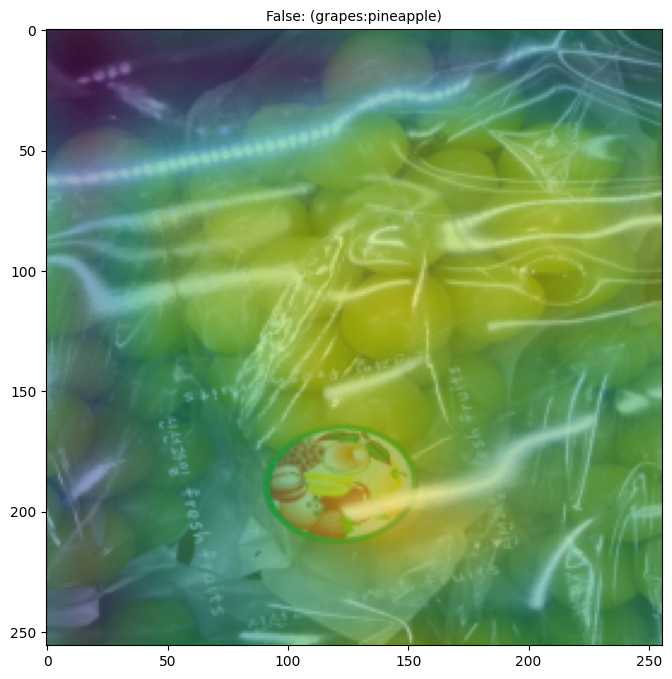

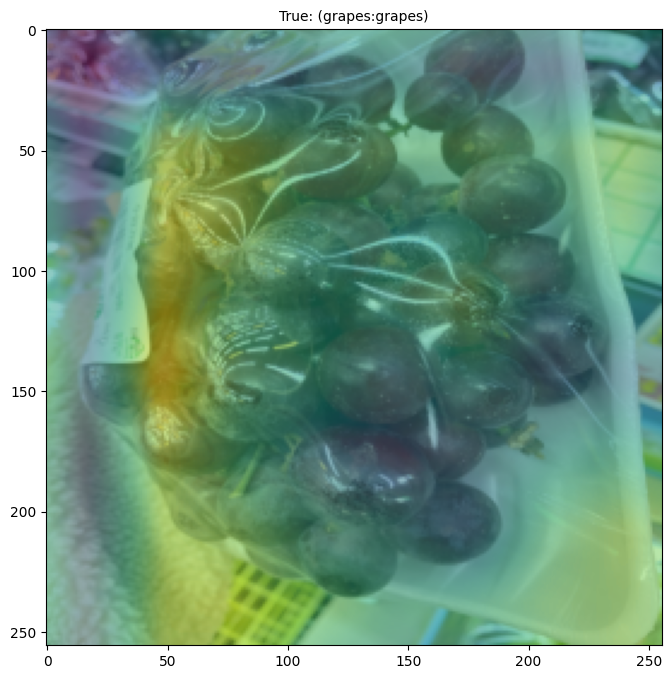

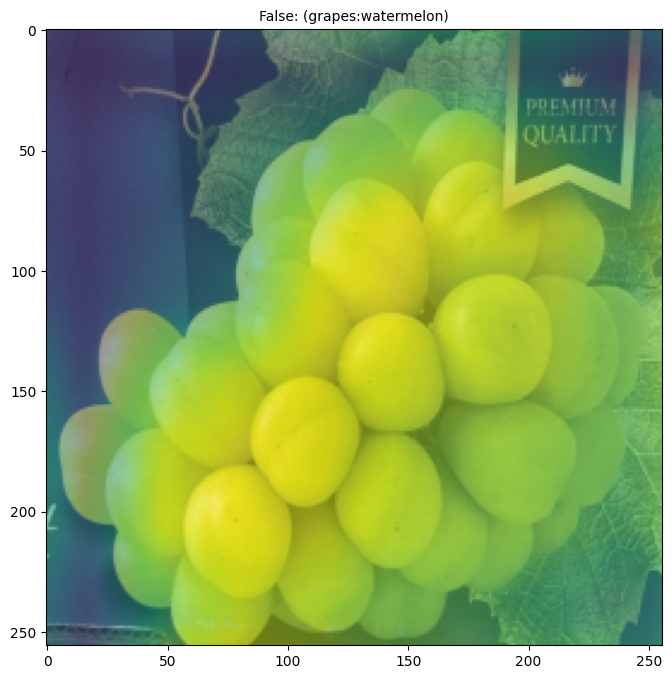

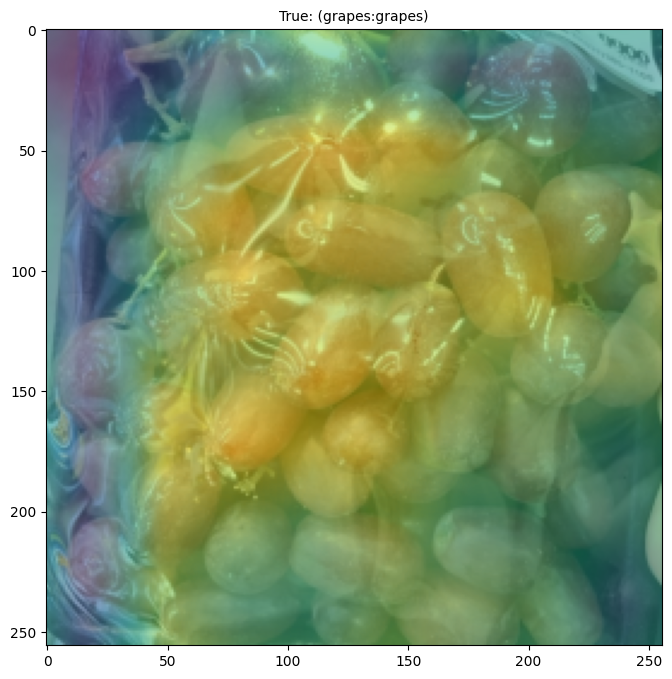

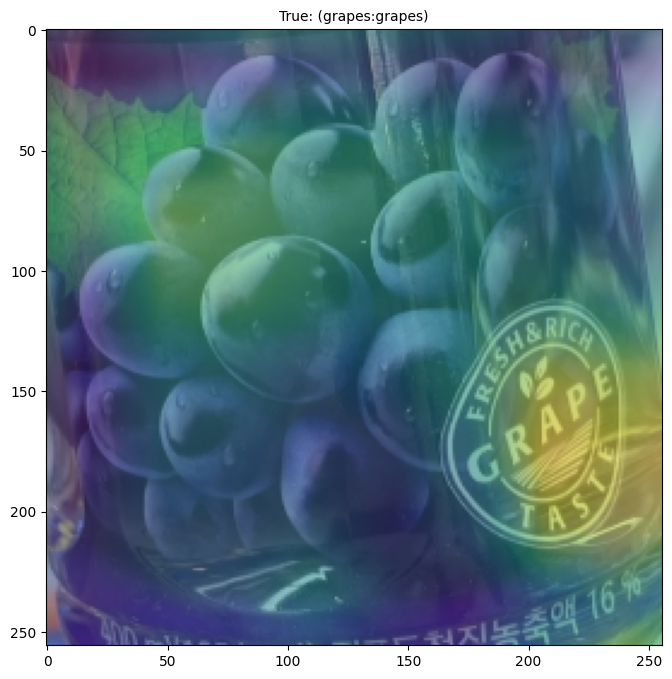

...

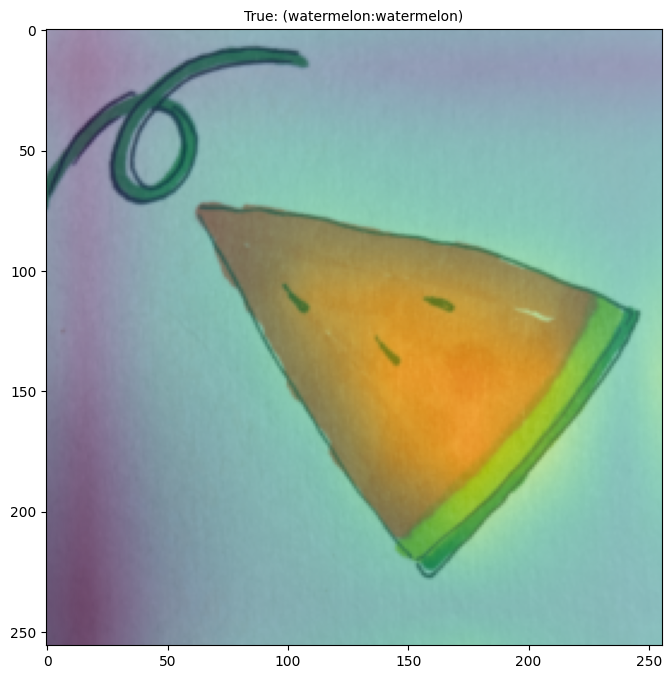

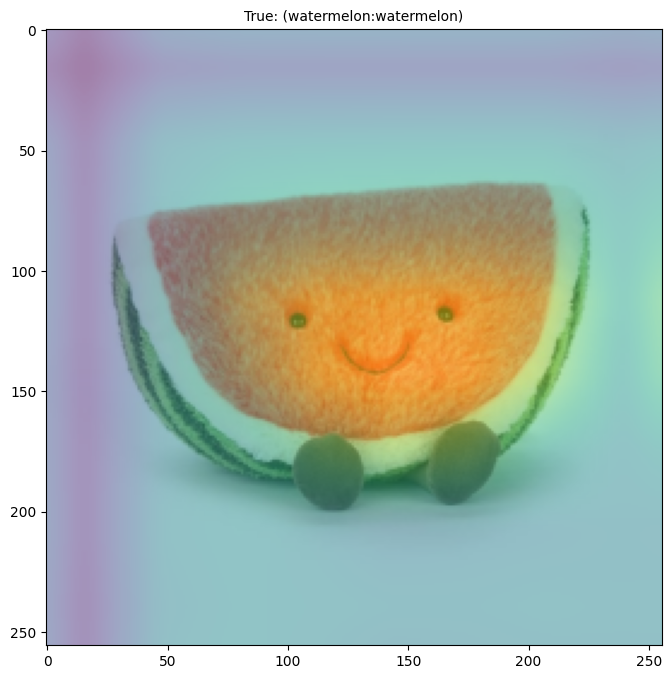

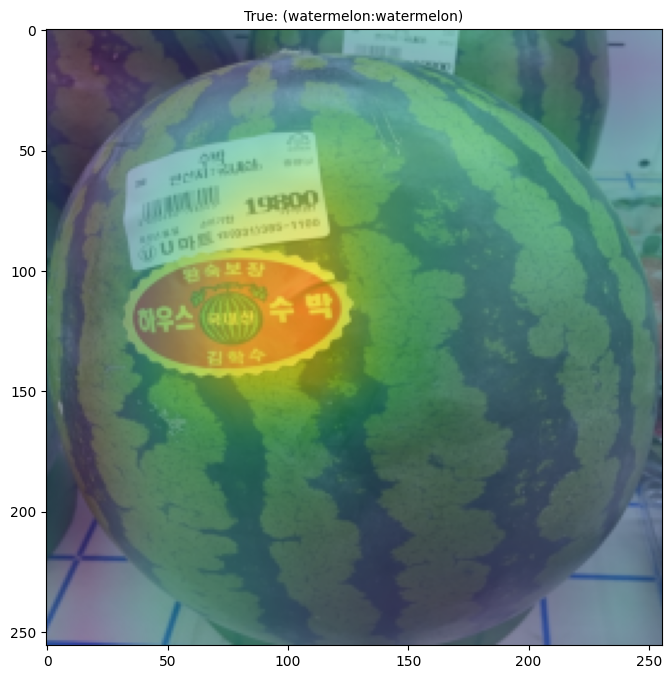

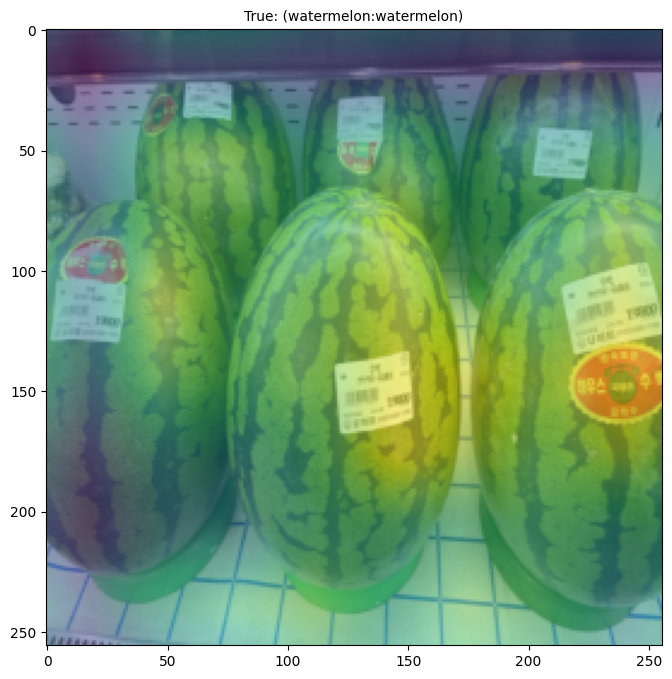

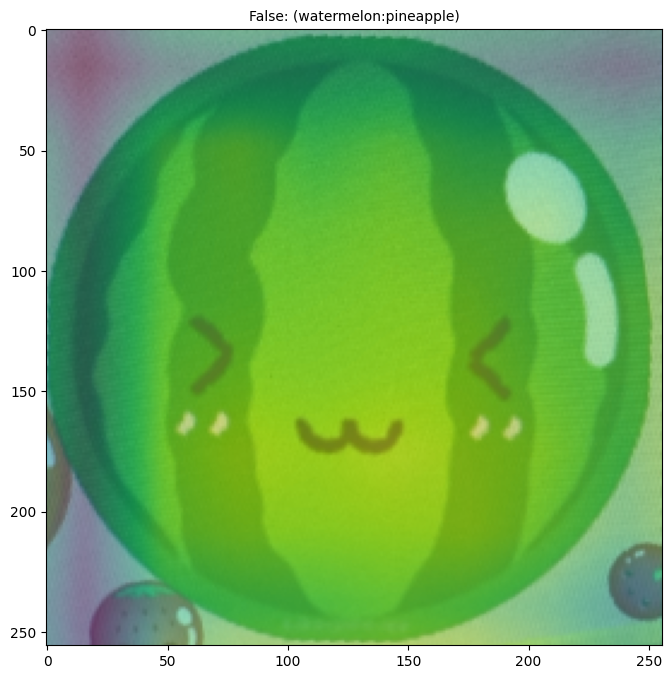

In [7]:
test_cls('/home/student/Datasets/jhjeong/VUNO/prep_data/fruit5/', 
         '/home/student/Datasets/jhjeong/VUNO/post_data/fruit5',
         'resnet50', ['grapes', 'lemon', 'orange', 'pineapple', 'watermelon'])